# Using scEve model to improve clusterization

In [3]:
import warnings 
warnings.simplefilter('ignore')

import scanpy as sc
import scparadise
import os
import muon as mu
import numpy as np
import pandas as pd

sc.set_figure_params(dpi = 150, dpi_save = 600)

/home/vadim/anaconda3/envs/scrna_rapids/lib/python3.11/site-packages/optuna/study/_optimize.py:20: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from optuna import progress_bar as pbar_module
Seed set to 0


In [6]:
os.chdir('/mnt/c/Users/vadim/scRNA/scParadise/scripts_package/')

## Recommendations about dataset 
Our models trained using shifted logarithm normalized data. <br>
We recommend shifted logarithm data normalization method to proper usage of our models: <br>
sc.pp.normalize_total(adata, target_sum=None) <br>
sc.pp.log1p(adata) <br>
adata.raw = adata

In [7]:
# Load dataset from 10x Genomics preprocessed using SoupX and scDblFinder
adata = sc.read_10x_h5("PBMC_clusterization/SoupX_matrix.h5")
meta = pd.read_csv("PBMC_clusterization/meta_scDblFinder_disease_sample.csv", index_col=0)
adata.obs = meta
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 5247 × 17805
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'scDblFinder.class', 'scDblFinder.score'
    var: 'gene_ids'

In [8]:
# Load ADT data from 10x Genomics
url = "https://cf.10xgenomics.com/samples/cell-exp/3.1.0/5k_pbmc_protein_v3/5k_pbmc_protein_v3_filtered_feature_bc_matrix.h5"
mdata = mu.read_10x_h5("dataset.h5", backup_url = url)
mdata.var_names_make_unique()
adata_adt = mdata.mod['prot'].copy()
del mdata
adata_adt

AnnData object with n_obs × n_vars = 5247 × 32
    var: 'gene_ids', 'feature_types', 'genome', 'pattern', 'read', 'sequence'

## Gene expression data processing

In [9]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [10]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

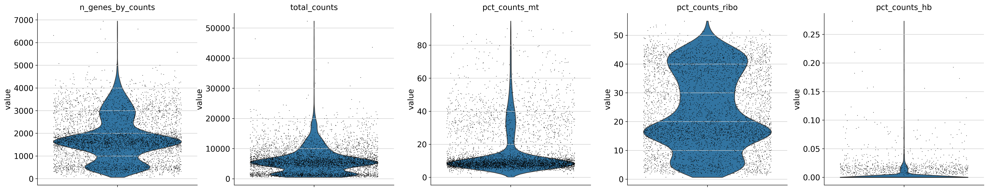

In [11]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", 'pct_counts_ribo', 'pct_counts_hb'],
    jitter=0.4, 
    multi_panel=True,
)

In [12]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [13]:
# Remove doublets + other QC metrics
#adata = adata[adata.obs['predicted_doublet'] == False]
adata = adata[adata.obs['scDblFinder.class'] == 'singlet']
sc.pp.filter_cells(adata, max_genes = 5000)
sc.pp.filter_cells(adata, max_counts = 20000)
adata = adata[adata.obs['pct_counts_mt'] < 20]

## Normalization, HVG, neighbors, PCA, UMAP

In [14]:
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalization
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata) 
# scParadise use normalized data in adata.raw!!!
adata.raw = adata
# HVG
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
# PCA
sc.tl.pca(adata)
# Nearest neighbors analysis
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15)
# UMAP
sc.tl.umap(adata)
# Clusterization
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_0.5')

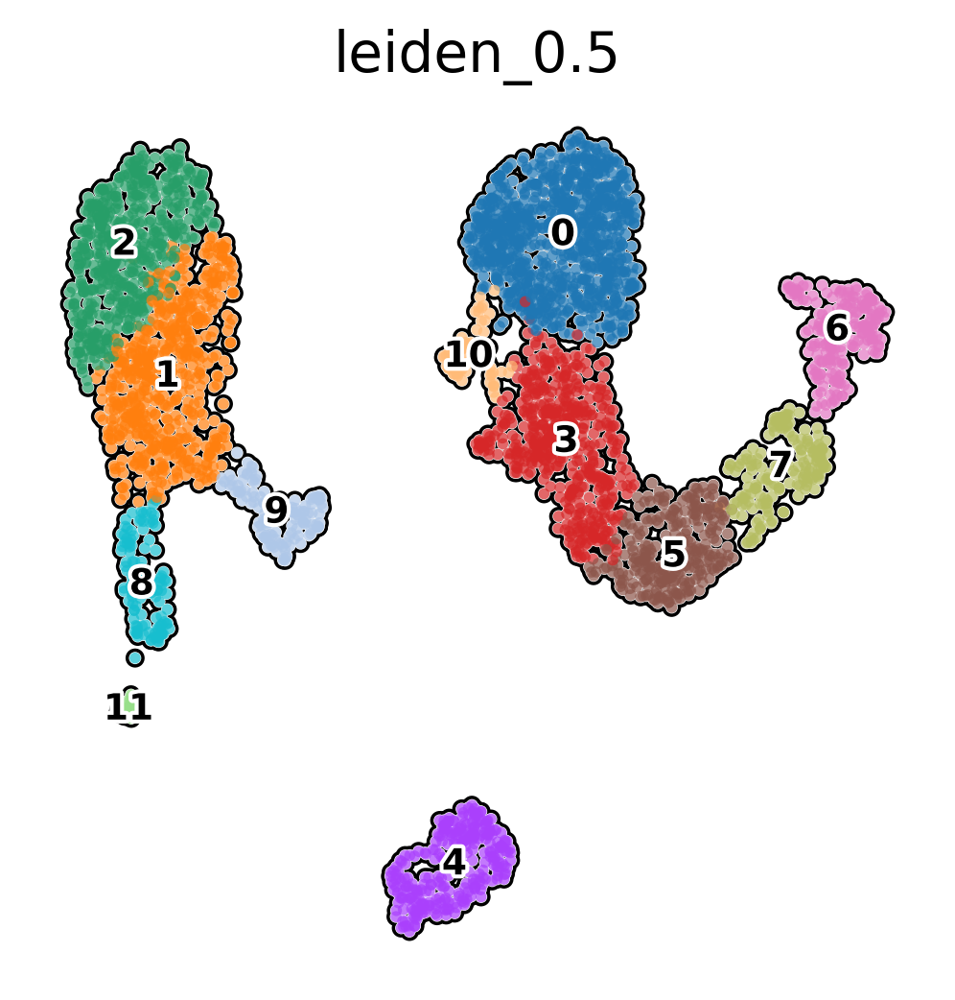

In [15]:
# Visualise predicted cell types levels and prediction probabilities
sc.pl.embedding(adata, 
                color = [
                    'leiden_0.5'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 9,
                legend_fontoutline = 2,
                save='clusterization.png')

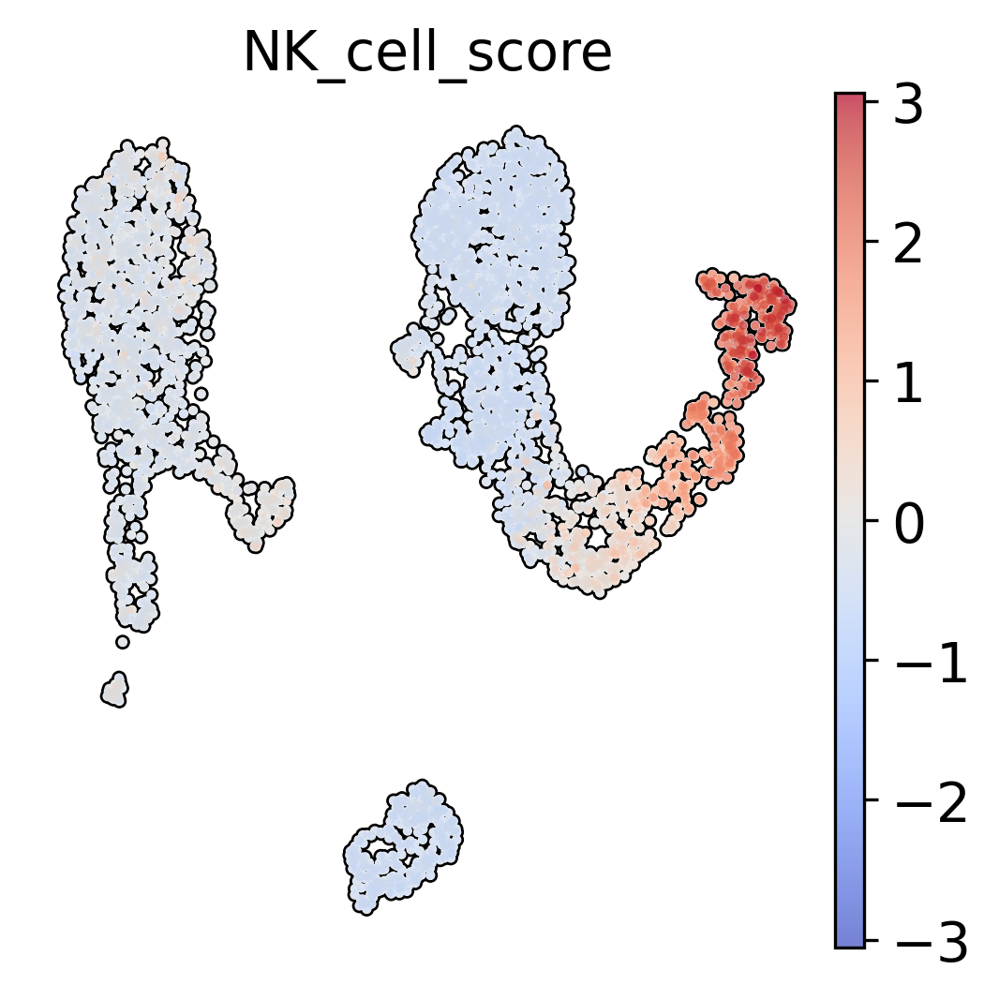

In [16]:
# Make symmetric palette with vmin and vmax
score = 'NK_cell_score'
markers = ['GNLY', 'NKG7', "FCER1G", 'KLRF1']
# Make mock column for plotting, here we use B cell score
sc.tl.score_genes(adata, markers, score_name=score)

# To make a symmetric palette centerd around 0 we set vmax to maximal absolut value and vmin to
# the negative value of maxabs
maxabs = max(abs(adata.obs[score]))
sc.pl.umap(
    adata, 
    color=score, 
    cmap="coolwarm", 
    frameon=False,
    add_outline=True,
    s=20, 
    vmin=-maxabs, 
    vmax=maxabs,
    save=score+'.png'
)

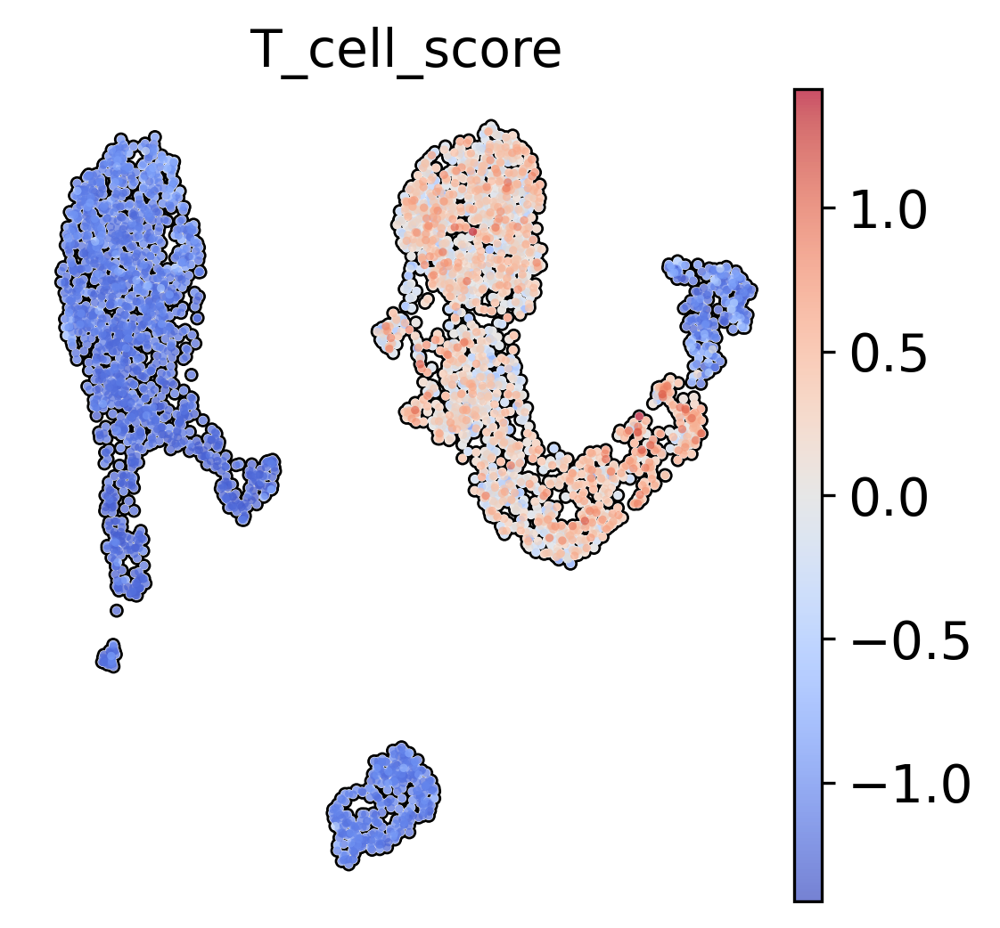

In [17]:
# Make symmetric palette with vmin and vmax
score = 'T_cell_score'
markers = ['CD3E', 'CD3G', 'CD3D']
# Make mock column for plotting, here we use B cell score
sc.tl.score_genes(adata, markers, score_name=score)

# To make a symmetric palette centerd around 0 we set vmax to maximal absolut value and vmin to
# the negative value of maxabs
maxabs = max(abs(adata.obs[score]))
sc.pl.umap(
    adata, 
    color=score, 
    cmap="coolwarm", 
    frameon=False,
    add_outline=True,
    s=20, 
    vmin=-maxabs, 
    vmax=maxabs,
    save=score+'.png'
)

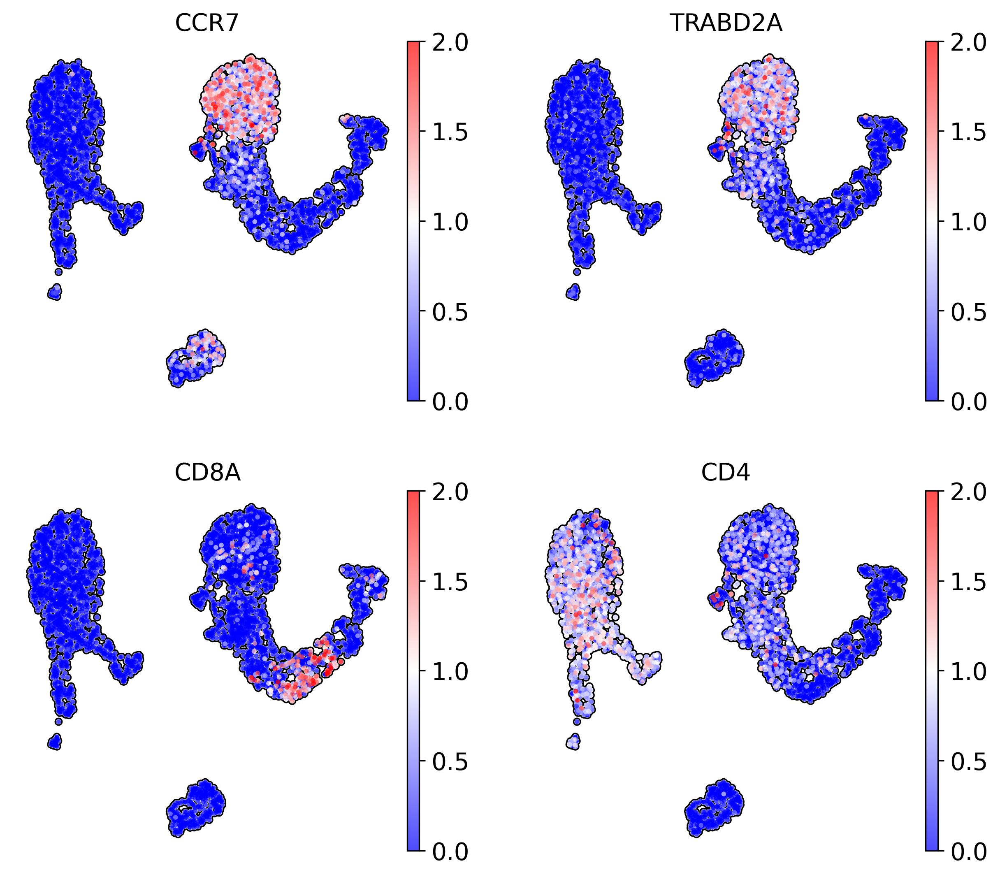

In [18]:
# Visualise naive T cells markers
sc.pl.embedding(adata, 
                color = [
                    'CCR7',
                    'TRABD2A',
                    'CD8A', 
                    'CD4'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                cmap = 'bwr',
                legend_loc = 'on data',
                legend_fontsize = 9,
                legend_fontoutline = 2,
                ncols = 2,
                vmax = 2.0,
                save='_naive_T_rna.png'
               )

In [19]:
adata.write_h5ad('PBMC_clusterization/pbmc_clusterization.h5ad')

## Observed ADT preprocessing

In [20]:
mu.prot.pp.clr(adata_adt)

In [21]:
adata_adt = adata_adt[adata.obs_names]
adata_adt.obsm['X_umap'] = adata.obsm['X_umap']

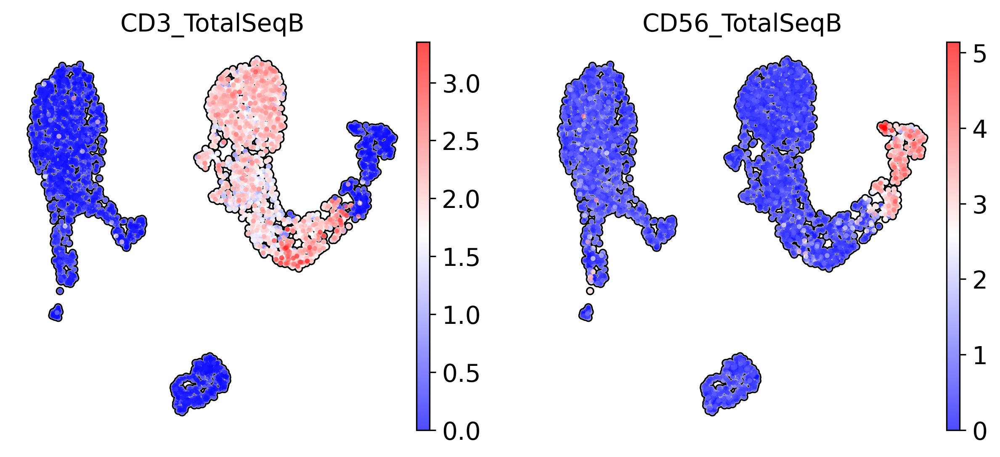

In [22]:
# Visualise naive T cells markers
sc.pl.embedding(adata_adt, 
                color = [
                    'CD3_TotalSeqB',
                    'CD56_TotalSeqB'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                cmap = 'bwr',
                legend_loc = 'on data',
                legend_fontsize = 9,
                legend_fontoutline = 2,
                ncols = 2,
                save='_observed_T_NK_rna.png'
               )

## scParadise prediction (scEve)

In [4]:
# Available models for surface protein prediction
scparadise.sceve.available_models()

RMSE - Root Mean Squared Error
MSE - Mean Squared Error
MAE - Mean Absolute Error



,Tissue/Model name,Description,Suspension,RMSE,MAE,Number of Proteins
0,Human_PBMC,Peripheral blood mononuclear cells of healthy ...,cells,0.305,0.226,224
1,Human_BMMC,Bone marrow mononuclear cell of healthy adults,cells,0.706,0.454,134


In [24]:
# Download model for surface protein prediction
scparadise.sceve.download_model(model_name = 'Human_PBMC', 
                                save_path = '')

In [26]:
# Predict surface proteins using trained model
mdata = scparadise.sceve.predict(adata, 
                                 path_model = 'Human_PBMC_scEve/',
                                 return_mdata = True)

Successfully loaded list of genes used for training model

Successfully loaded list of proteins used for training model

Successfully loaded model



## Clusterization and UMAP using predicted adt

In [27]:
# PCA
sc.tl.pca(mdata.mod['adt'], use_highly_variable=False)

In [28]:
# Concatenate PCA from rna and predicted adt
mdata.obsm["X_pca_concat"] = np.hstack([mdata.mod["rna"].obsm["X_pca"][:, :15], mdata.mod["adt"].obsm["X_pca"][:, :5]])
mdata.update()

In [29]:
# Nearest neighbors analysis
sc.pp.neighbors(mdata, n_neighbors=10, n_pcs=20, use_rep="X_pca_concat")
# UMAP
sc.tl.umap(mdata)
# Clusterization
sc.tl.leiden(mdata, resolution=0.5, key_added='leiden_0.5')

In [30]:
mdata.obsm['X_umap_rna'] = mdata.mod['rna'].obsm['X_umap']

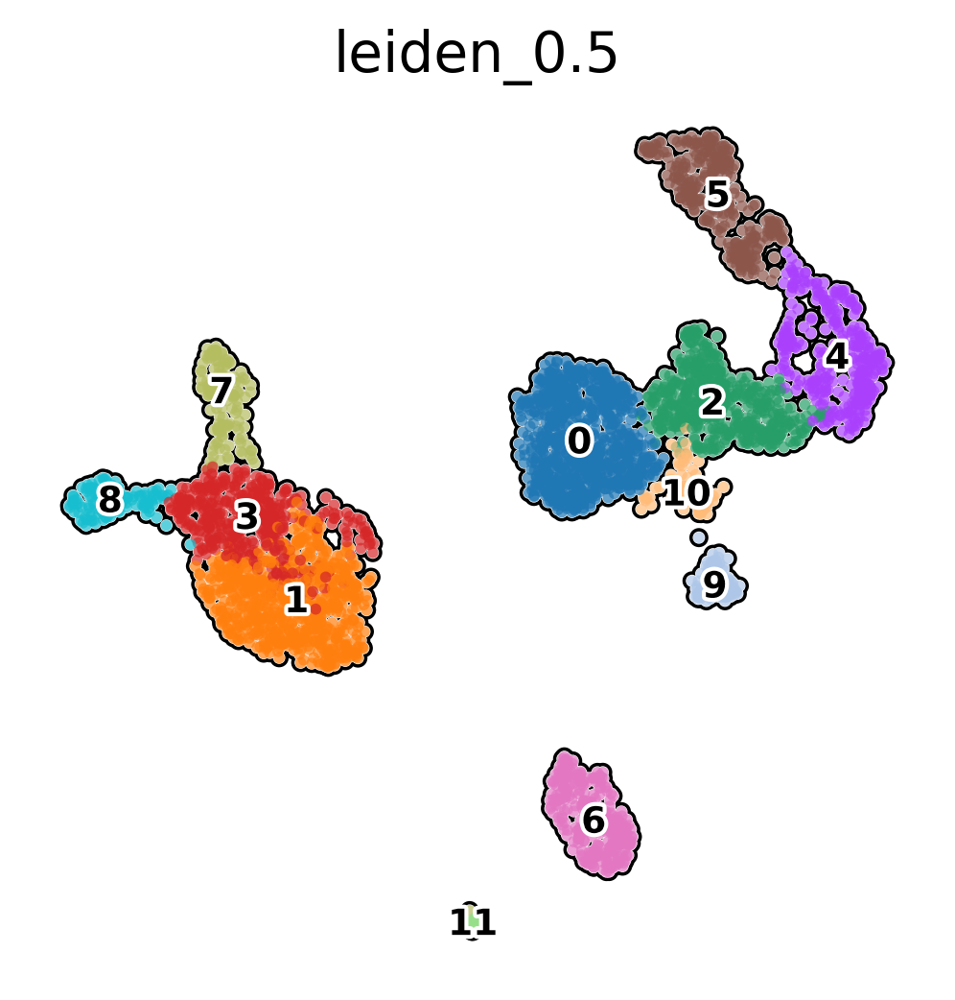

In [31]:
# Visualise clusterization on UMAP calculated using rna and predicted adt PCA
mu.pl.embedding(mdata, 
                color = [
                    'leiden_0.5'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 9,
                legend_fontoutline = 2,
                save='clusterization_adt.png'
               )

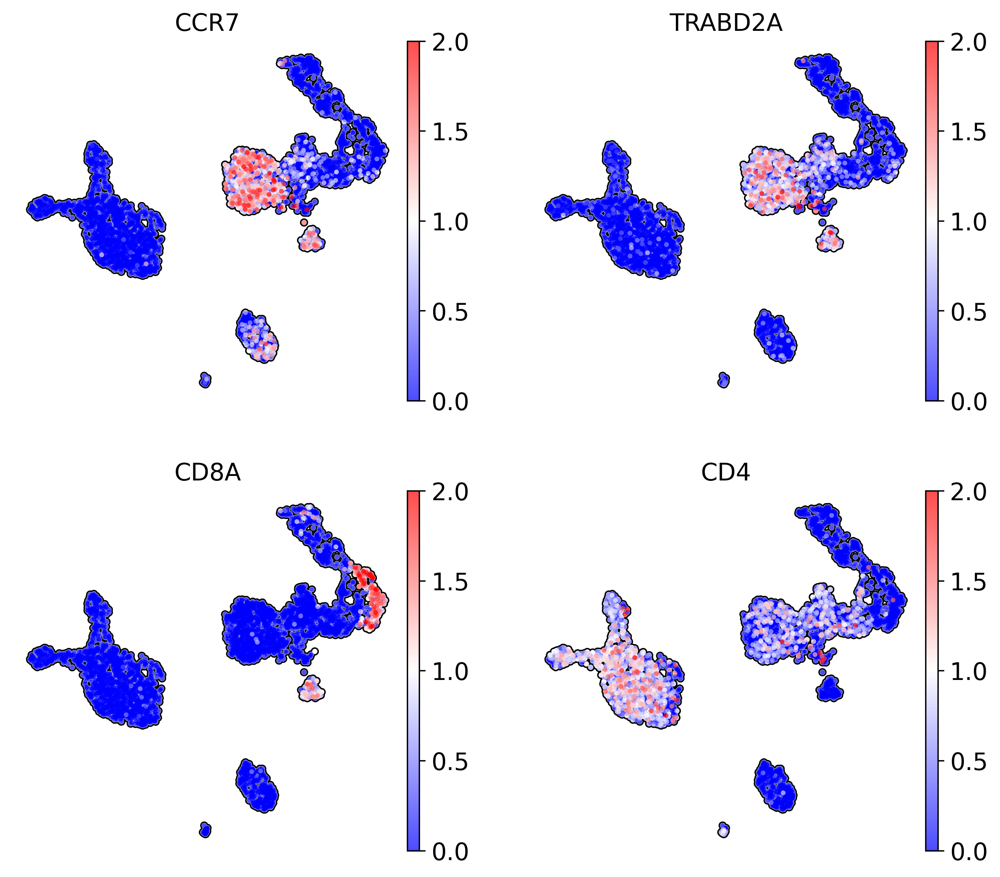

In [32]:
# Visualise naive T cells markers
mu.pl.embedding(mdata, 
                color = [
                    'CCR7',
                    'TRABD2A',
                    'CD8A', 
                    'CD4'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                cmap = 'bwr',
                legend_loc = 'on data',
                legend_fontsize = 9,
                legend_fontoutline = 2,
                ncols = 2,
                vmax = 2.0,
                save='_naive_T_adt.png'
               )

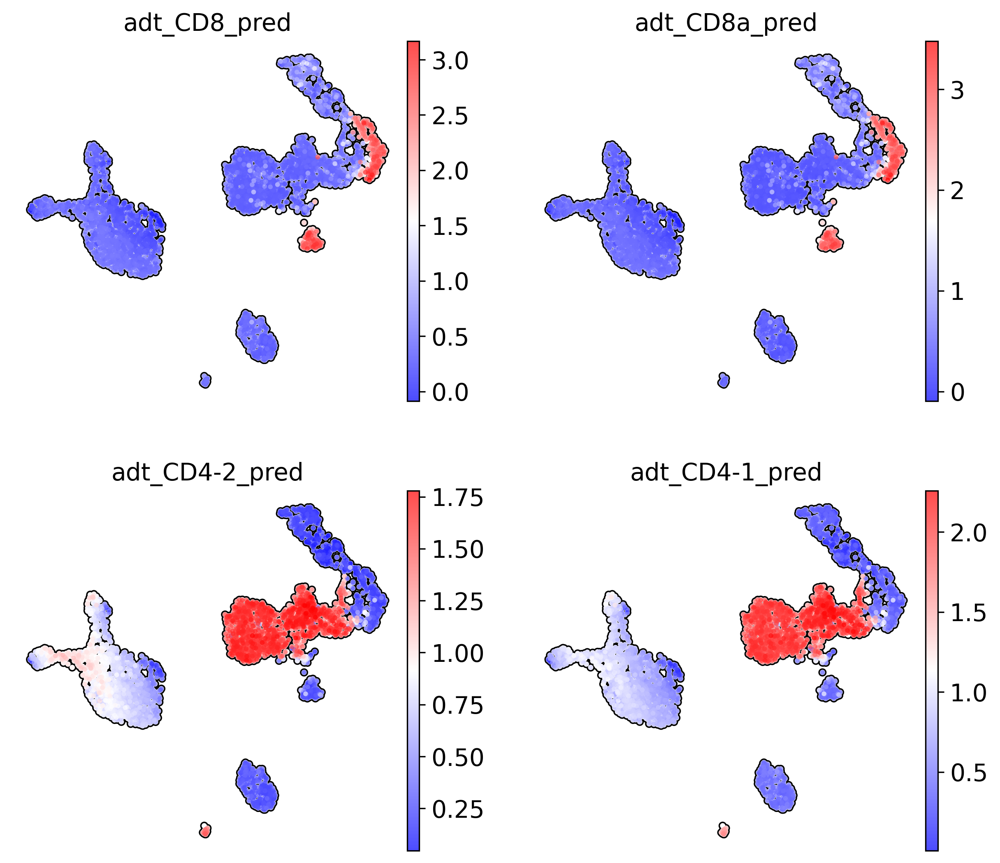

In [33]:
# Visualise naive T cells markers
mu.pl.embedding(mdata, 
                color = [
                    'adt_CD8_pred', 
                    'adt_CD8a_pred',
                    'adt_CD4-2_pred', 
                    'adt_CD4-1_pred'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                cmap = 'bwr',
                legend_loc = 'on data',
                legend_fontsize = 9,
                legend_fontoutline = 2,
                ncols = 2,
                save='_T_subtypes_adt.png'
               )

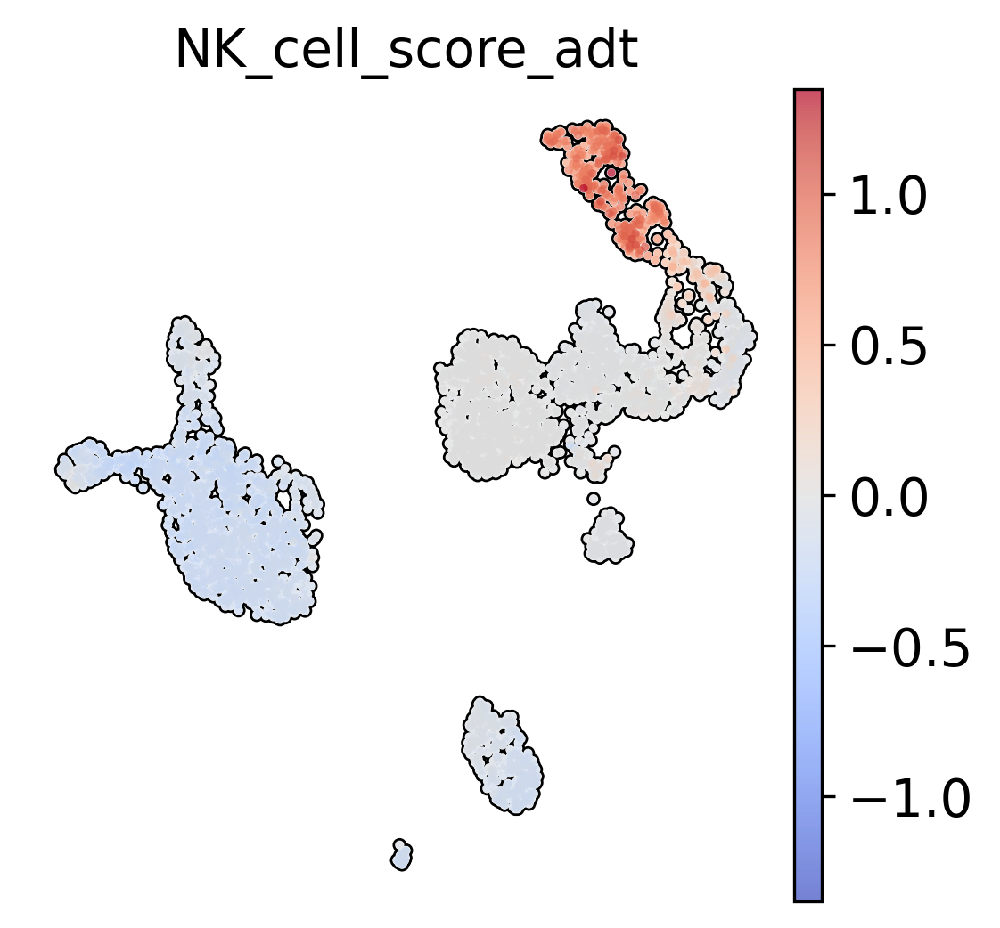

In [34]:
# Make symmetric palette with vmin and vmax
score = 'NK_cell_score_adt'
markers = ['adt_CD56-1_pred', 'adt_CD56-2_pred', 'adt_CD158b_pred', 'adt_CD158_pred', 'adt_CD335_pred']
# Make mock column for plotting, here we use B cell score
sc.tl.score_genes(mdata.mod['adt'], markers, score_name=score)

# To make a symmetric palette centerd around 0 we set vmax to maximal absolut value and vmin to
# the negative value of maxabs
maxabs = max(abs(mdata.mod['adt'].obs[score]))
mdata.obs[score] = mdata.mod['adt'].obs[score].copy()
sc.pl.umap(
    mdata, 
    color=score, 
    cmap="coolwarm", 
    frameon=False,
    add_outline=True,
    s=20, 
    vmin=-maxabs, 
    vmax=maxabs,
    save=score+'.png'
)

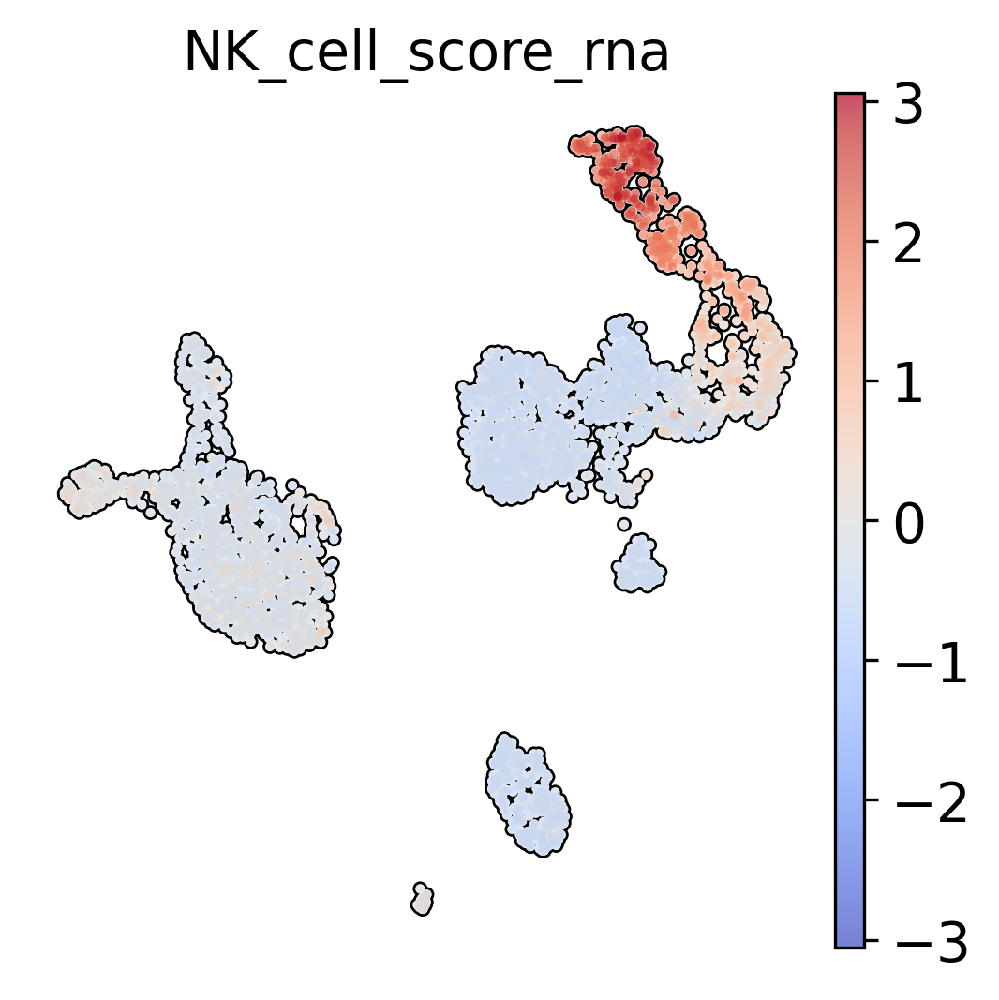

In [35]:
# Make symmetric palette with vmin and vmax
score = 'NK_cell_score_rna'
markers = ['GNLY', 'NKG7', "FCER1G", 'KLRF1']
# Make mock column for plotting, here we use B cell score
sc.tl.score_genes(mdata.mod['rna'], markers, score_name=score)

# To make a symmetric palette centerd around 0 we set vmax to maximal absolut value and vmin to
# the negative value of maxabs
maxabs = max(abs(mdata.mod['rna'].obs[score]))
mdata.obs[score] = mdata.mod['rna'].obs[score].copy()
sc.pl.umap(
    mdata, 
    color=score, 
    cmap="coolwarm", 
    frameon=False,
    add_outline=True,
    s=20, 
    vmin=-maxabs, 
    vmax=maxabs,
    save=score+'.png'
)

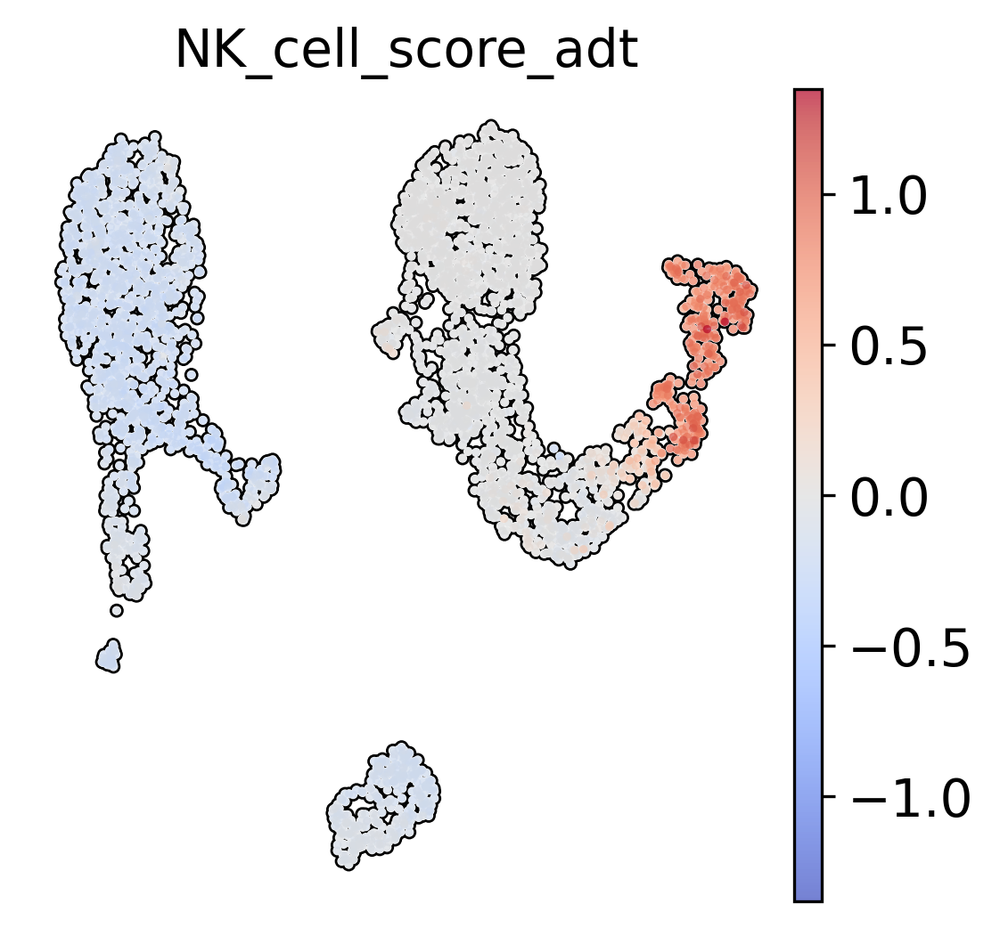

In [36]:
# Make symmetric palette with vmin and vmax
score = 'NK_cell_score_adt'
markers = ['adt_CD56-1_pred', 'adt_CD56-2_pred', 'adt_CD158b_pred', 'adt_CD158_pred', 'adt_CD335_pred']
# Make mock column for plotting, here we use B cell score
sc.tl.score_genes(mdata.mod['adt'], markers, score_name=score)

# To make a symmetric palette centerd around 0 we set vmax to maximal absolut value and vmin to
# the negative value of maxabs
maxabs = max(abs(mdata.mod['adt'].obs[score]))
mdata.obs[score] = mdata.mod['adt'].obs[score].copy()
sc.pl.embedding(
    mdata, 
    basis='X_umap_rna',
    color=score, 
    cmap="coolwarm", 
    frameon=False,
    add_outline=True,
    s=20, 
    vmin=-maxabs, 
    vmax=maxabs,
    save=score+'_X_umap_rna.png'
)

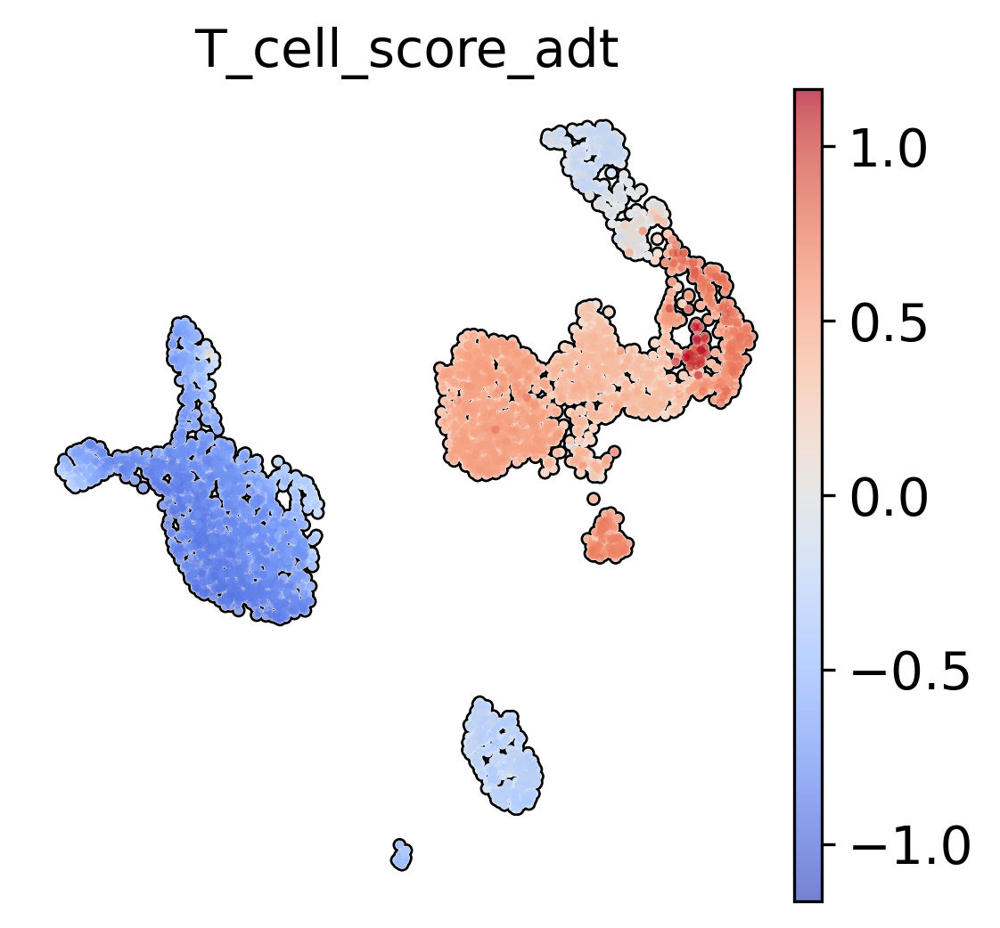

In [37]:
# Make symmetric palette with vmin and vmax
score = 'T_cell_score_adt'
markers = ['adt_CD3-1_pred','adt_CD3-2_pred']
# Make mock column for plotting, here we use B cell score
sc.tl.score_genes(mdata.mod['adt'], markers, score_name=score)

# To make a symmetric palette centerd around 0 we set vmax to maximal absolut value and vmin to
# the negative value of maxabs
maxabs = max(abs(mdata.mod['adt'].obs[score]))
mdata.obs[score] = mdata.mod['adt'].obs[score].copy()
sc.pl.umap(
    mdata, 
    color=score, 
    cmap="coolwarm", 
    frameon=False,
    add_outline=True,
    s=20, 
    vmin=-maxabs, 
    vmax=maxabs,
    save=score+'.png'
)

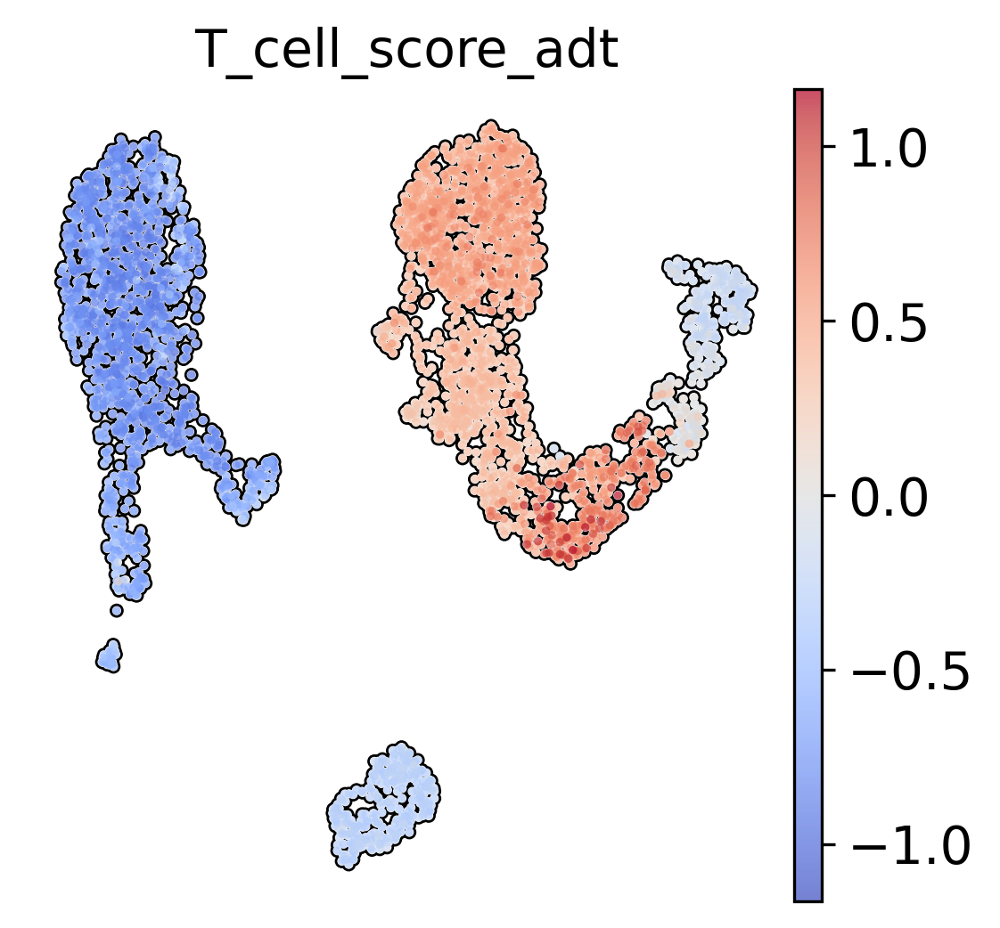

In [38]:
# Make symmetric palette with vmin and vmax
score = 'T_cell_score_adt'
markers = ['adt_CD3-1_pred','adt_CD3-2_pred']
# Make mock column for plotting, here we use B cell score
sc.tl.score_genes(mdata.mod['adt'], markers, score_name=score)

# To make a symmetric palette centerd around 0 we set vmax to maximal absolut value and vmin to
# the negative value of maxabs
maxabs = max(abs(mdata.mod['adt'].obs[score]))
mdata.obs[score] = mdata.mod['adt'].obs[score].copy()
sc.pl.embedding(
    mdata, 
    basis='X_umap_rna',
    color=score, 
    cmap="coolwarm", 
    frameon=False,
    add_outline=True,
    s=20, 
    vmin=-maxabs, 
    vmax=maxabs,
    save=score+'_X_umap_rna.png'
)

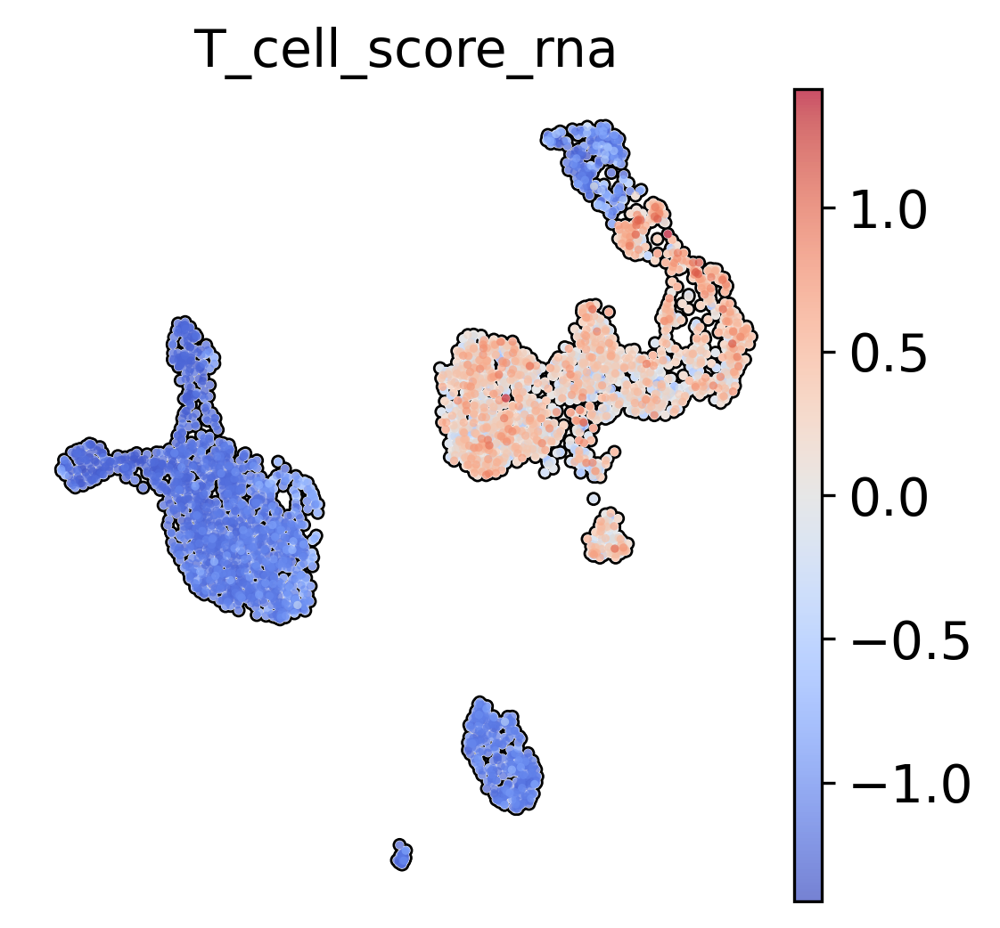

In [39]:
# Make symmetric palette with vmin and vmax
score = 'T_cell_score_rna'
markers = ['CD3E', 'CD3G', "CD3D"]
# Make mock column for plotting, here we use B cell score
sc.tl.score_genes(mdata.mod['rna'], markers, score_name=score)

# To make a symmetric palette centerd around 0 we set vmax to maximal absolut value and vmin to
# the negative value of maxabs
maxabs = max(abs(mdata.mod['rna'].obs[score]))
mdata.obs[score] = mdata.mod['rna'].obs[score].copy()
sc.pl.umap(
    mdata, 
    color=score, 
    cmap="coolwarm", 
    frameon=False,
    add_outline=True,
    s=20, 
    vmin=-maxabs, 
    vmax=maxabs,
    save=score+'.png'
)

In [40]:
adata_adt.obsm['X_umap'] = mdata.obsm['X_umap']

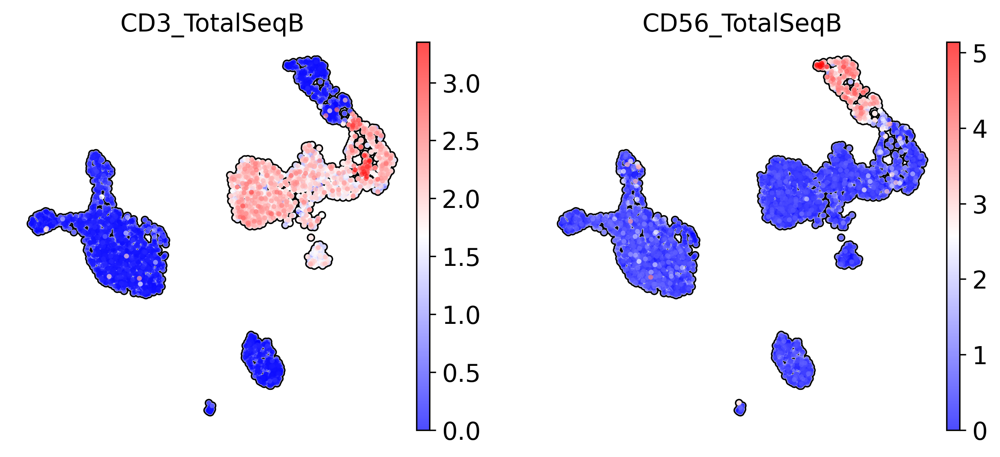

In [41]:
# Visualise naive T cells markers
sc.pl.embedding(adata_adt, 
                color = [
                    'CD3_TotalSeqB',
                    'CD56_TotalSeqB'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                cmap = 'bwr',
                legend_loc = 'on data',
                legend_fontsize = 9,
                legend_fontoutline = 2,
                ncols = 2,
                save='_observed_T_NK_mdata.png'
               )

In [42]:
mdata.write_h5mu('PBMC_clusterization/pbmc_clusterization_mdata.h5ad')

In [43]:
pip list

Package                       Version
----------------------------- --------------
absl-py                       2.1.0
adjustText                    1.2.0
aiohappyeyeballs              2.3.6
aiohttp                       3.10.3
aiosignal                     1.3.1
alabaster                     1.0.0
alembic                       1.13.2
anndata                       0.10.8
annoy                         1.17.3
anyio                         4.4.0
appdirs                       1.4.4
argon2-cffi                   23.1.0
argon2-cffi-bindings          21.2.0
array_api_compat              1.8
arrow                         1.3.0
asttokens                     2.4.1
async-lru                     2.0.4
attrs                         24.2.0
Babel                         2.14.0
beautifulsoup4                4.12.3
bleach                        6.1.0
bokeh                         3.4.2
branca                        0.7.2
Brotli                        1.1.0
cached-property               1.5.2
cachetools